Timm Walz - Microsoft Consulting Services - tiwalz@microsoft.com
# Delivery Data Scientist Case

The annual “family-level” data files included here (available on the National Bureau of Economic Research (NBER) web site, www.nber.org) are the result of linking the four quarterly interviews for each Consumer Expenditure Survey (CE) respondent family. The processed data also collapses the hundreds of spending, income, and wealth categories into
a consistent set of categories across the years. Our hypothetical customer is a manufacturer of consumer goods and we want to find a way to use this data to help our customer. 

Propose one way of using this data employing one of the following methods: 
- regression, 
- classification or 
- clustering. 

Execute your proposal and discuss your methodology, justify your algorithm/ feature selection and share insights from the model. We're interested in understanding your approach as well as your ability to communicate any insights derived from your model to our hypothetical customer. The output should include a PowerPoint or PDF document. You will be expected to present your findings at a scheduled interview to follow.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Import standard packages
import pandas as pd
import logging
import seaborn as sns
import numpy as np
import sys
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(11,8)})

# Import custom functions, laid out to helper function to keep the code more neat & clean :)
import helper

### Data Import

In [2]:
# Import supplementary price data
df_sup = pd.read_csv('../assets/Data_Supplementary_price.csv')
print(f"Sample of supplementary price data (total length {len(df_sup)})")
display(df_sup.sample(5))

# Import consumer expenditure data
df_exp = pd.read_csv('../assets/Data_consumer_expenditure_survey.csv').set_index('newid')
print(f"\nSample of consumer expenditure data (total length {len(df_exp)})")
display(df_exp.sample(5))

Sample of supplementary price data (total length 42)


,year,quarter,date,clothes_price,foodhome_price,servants_price,admissions_price,jewelry_price,books_price,foodout_price,...,charity_price,housuppl_price,all_price,telephon_price,tailors_price,busiserv_price,lifeins_price,tolls_price,autoins_price,othrec_price
25,1996,4,147,102.302246,93.938339,97.680466,85.464272,102.302246,84.132652,92.326660,...,92.789047,92.971596,92.789047,107.272003,92.024002,93.464996,79.883003,90.149002,90.149002,88.556999
31,1998,2,153,102.257233,96.490097,98.817490,89.835838,102.257233,90.830872,95.946350,...,95.063644,95.415787,95.063644,106.117996,95.475998,98.266998,88.834000,95.329002,95.329002,93.598000
1,1990,2,121,96.758842,79.481705,88.811646,66.397888,96.758842,61.894554,79.707069,...,76.857185,82.358376,76.857185,103.765999,79.433998,76.015999,61.741001,59.712002,59.712002,73.804001
4,1991,1,124,99.356911,80.901550,90.416473,69.113396,99.356911,64.413086,81.610611,...,79.078545,84.014992,79.078545,104.560997,82.730003,80.128998,64.170998,63.130001,63.130001,77.445999
0,1990,1,120,95.762054,78.836319,88.311348,65.591553,95.762054,61.191986,78.942696,...,75.879593,81.597961,75.879593,103.765999,79.433998,76.015999,61.741001,59.712002,59.712002,73.804001



Sample of consumer expenditure data (total length 12064)


,age,educatio,race,sex,weeksin,emplcont,incoll,nonwork,marital,empstat,...,alc_tob,domestic_svcs,ent,other_nd,nondurable,nondurable_housing,nondurable_core,work_related,nondurable_housing_adj,nondurable_core_food
newid,,,,,,,,,,,,,,,,,,,,,
92295,31,39,4,1,52,1,3,\N,1,1,...,544.343445,0.000000,990.405762,41.857590,22372.52734,42548.12109,24886.841800,8270.347656,42003.77734,33733.42969
92637,36,41,2,2,52,1,3,\N,1,4,...,20.919270,904.519714,157.054642,1466.877563,16730.87891,24481.17773,12758.765630,8202.039063,24460.25781,16258.22070
99982,32,11,1,1,52,2,\N,\N,1,1,...,308.136139,1086.578125,535.147583,307.622467,17723.14453,24197.99023,9480.209961,11111.201170,23889.85352,12778.65137
74355,47,39,1,1,52,1,3,\N,1,3,...,2998.679688,573.080078,2006.617188,0.000000,21838.41406,33512.91016,17315.121090,6632.426270,30514.23047,23881.80469
113449,57,43,1,1,52,1,3,\N,3,1,...,616.280396,427.472534,1978.000000,1935.446777,19546.77734,35669.36719,23281.324220,9499.926758,35053.08594,25553.15625


In [3]:
# Replace "\N" in 'nonwork' (reason for not working) by 0 and assume that it means that person works
df_exp['work'] = df_exp['nonwork'].replace('\\N', 0).astype(int)
# Extract demographic information and assign it to a separate data frame
cols_dem = ['age', 'hhsize', 'num_child', 'blsurbn', 'income', 'educatio', 'race', 'sex', 'work', 'empstat', 'occup', 'emptype', 'marital']
df_exp_demographic = df_exp[cols_dem]

In [4]:
# Info about demographic data
df_exp_demographic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12064 entries, 113440 to 79303
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        12064 non-null  int64  
 1   hhsize     12064 non-null  int64  
 2   num_child  12064 non-null  int64  
 3   blsurbn    12064 non-null  int64  
 4   income     12064 non-null  float64
 5   educatio   12064 non-null  int64  
 6   race       12064 non-null  int64  
 7   sex        12064 non-null  int64  
 8   work       12064 non-null  int64  
 9   empstat    12064 non-null  object 
 10  occup      12064 non-null  object 
 11  emptype    12064 non-null  object 
 12  marital    12064 non-null  int64  
dtypes: float64(1), int64(9), object(3)
memory usage: 1.3+ MB


### Exploratory Data Analysis
First, we want to gain a rough overview and understanding of the underlying data set. 
- Who are the people who have participated in the survey? 
- What is their background?

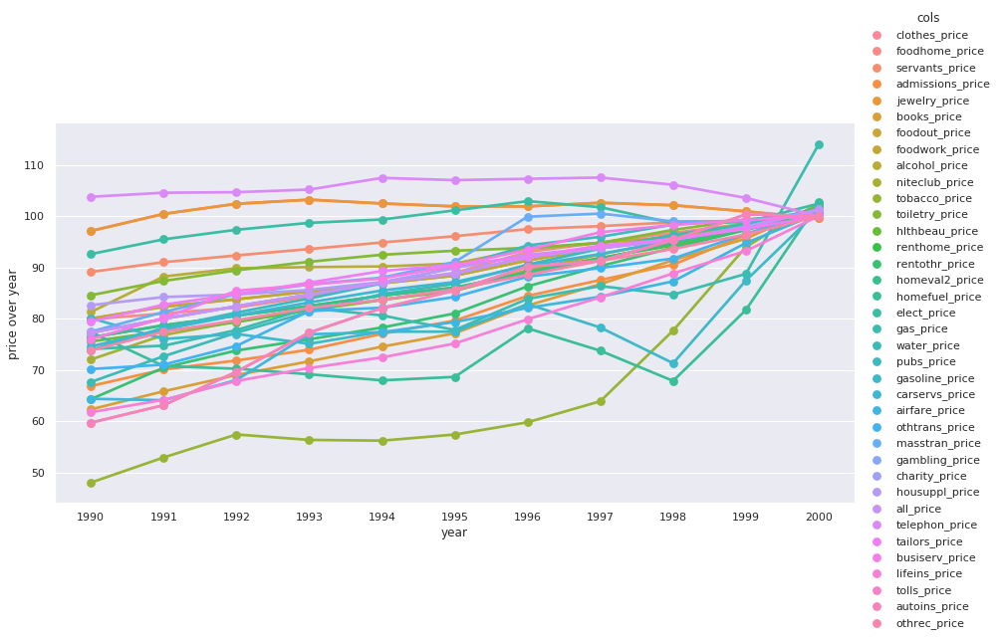

In [41]:
# Plot the supplement dataset to gain an overview on how prices develop over the past couple of years
df_sup_grouped = df_sup.groupby(['year']).mean().reset_index()
dfx = df_sup_grouped.drop(['quarter', 'date'], axis=1).melt('year', var_name='cols', value_name='price over year')
g = sns.factorplot(x="year", y="price over year", hue='cols', data=dfx, size=6, aspect=2)

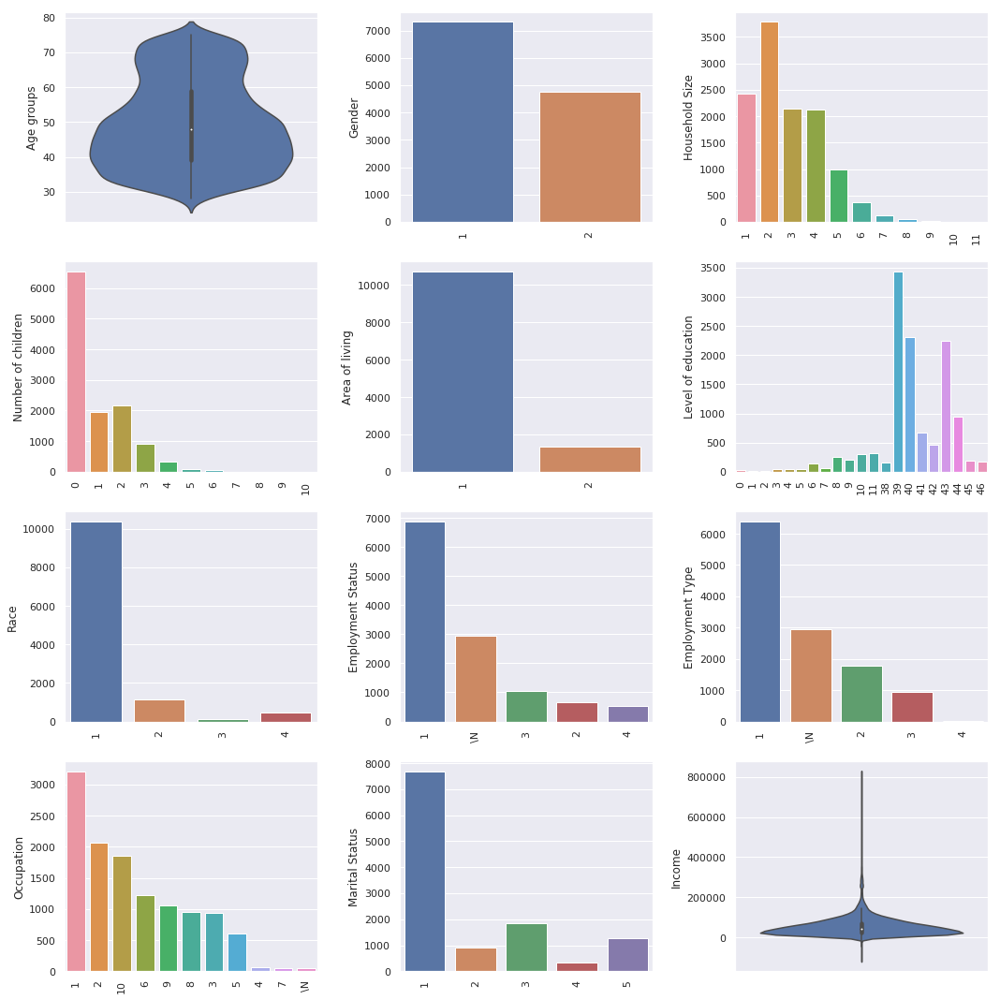

In [6]:
# Get plots of demographic data, function is imported from helper
helper.get_demographic_plots(df_exp)

In [7]:
# Select columns for expenditure analysis based on the supplement data
# They cover common consumer goods
consum_features = [
    'alcohol',
    'books',
    'clothes',
    'elect',
    'food',
    'foodhome',
    'foodout',
    'foodwork',
    'gambling',
    'gas',
    'gasoline',
    'hlthbeau',
    'homefuel',
    'homeval2',
    'housuppl',
    'jewelry',
    'tailors',
    'telephon',
    'tobacco',
    'utility',
    'water']

In [8]:
# Extract the relevant information from the expenditure data frame
df_exp_values = df_exp[consum_features]

<module 'matplotlib.pyplot' from '/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/matplotlib/pyplot.py'>

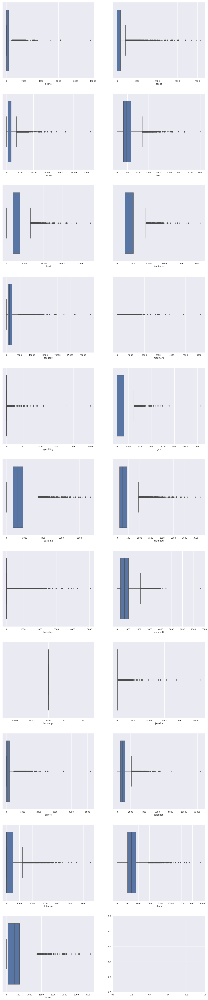

In [9]:
# Create boxplots to see the distribution of the values for every variable
helper.get_expenditure_boxplots(df_exp_values)

In [10]:
# Variables housuppl and toiletry seem to be missing or there are no values, so we remove them from the df
df_exp_values.drop(['housuppl', 'foodwork', 'gambling', 'homefuel'], axis=1, inplace=True)

/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/pandas/core/frame.py:4169: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### Outlier Removal
We have seen that there is quite a lot of noise in the data
Therefore, we want to remove the outliers and replace them based on the percentiles (0.05, 0.95)

In [11]:
df_exp_clean = df_exp_values.copy()
def remove_outliers(df_exp_clean):
    '''Remove outliers based on percentiles'''
    for column in list(df_exp_clean):
        percentiles = df_exp_clean[column].quantile([0.05, 0.95]).values
        df_exp_clean[column][df_exp_clean[column] <= percentiles[0]] = percentiles[0]
        df_exp_clean[column][df_exp_clean[column] >= percentiles[1]] = percentiles[1]
    return df_exp_clean

In [12]:
# Run the function
df_exp_clean = remove_outliers(df_exp_clean)

/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/anaconda/envs/azureml_p

<module 'matplotlib.pyplot' from '/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/matplotlib/pyplot.py'>

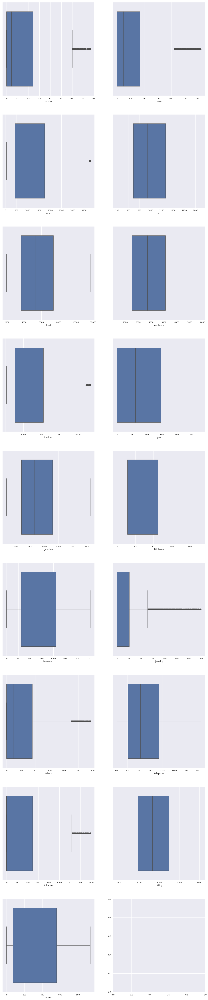

In [13]:
# Run the boxplot function again based on the cleaned data
helper.get_expenditure_boxplots(df_exp_clean)
# Looks much cleaner now!

In [14]:
# Have a glance at the data
df_exp_clean.head()

,alcohol,books,clothes,elect,food,foodhome,foodout,gas,gasoline,hlthbeau,homeval2,jewelry,tailors,telephon,tobacco,utility,water
newid,,,,,,,,,,,,,,,,,
113440,12.0,100,843.0,1510.0,7480.284180,7605.0,72.45,558,1260.00,0,1000.0,0,0,1100.00,0,4454.104980,939.85
82908,690.0,0,581.0,258.0,5940.490723,5469.0,150.00,193,270.00,165,0.0,0,454,1236.00,0,1763.586182,128.00
110538,36.0,0,856.0,900.0,4865.043945,2405.0,2495.00,407,1080.00,372,862.5,0,0,1478.00,1365,2880.115479,151.00
104594,60.0,0,3670.0,1196.0,6252.730469,3040.0,3175.00,700,3123.85,921,1112.5,48,166,2069.85,1352,5074.171655,939.85
91105,204.0,150,2534.0,1006.0,6654.810059,5510.0,940.00,1001,1270.00,18,1550.0,313,78,1230.00,0,3764.690674,381.00


## Principal Component Analysis
There are quite a few variables in our data set, which can be overwhelming and complex.
We will reduce the dimensions of the data by creating so-called principal components:
Principal Component Analysis (PCA) is a dimensionality-reduction method that is used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set.

In [15]:
# Import required packages
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [16]:
# Standardizing the features to have less variance in the data and make the values across the variables more homogeneous
expenditures_scaled = StandardScaler().fit_transform(df_exp_clean.values)

In [17]:
# First, we create a plot to see how many principal components we need to picture the data in a way, that there are 
# less dimensions, but still enough information left to gain valuable and realistic insights
def get_explained_variance_plot(expenditures_scaled):
    '''Gets scaled expenditures and creates a plot for explained variance'''
    pca = PCA()
    pca.fit_transform(expenditures_scaled)
    explained_variance = np.cumsum(pca.explained_variance_ratio_)
    fig = px.area(
        x = range(1, explained_variance.shape[0] + 1),
        y = explained_variance,
        labels = {"x": "Number of Principal Components", "y": "Explained Variance"}
    )
    return fig

In [18]:
# Run the function
get_explained_variance_plot(expenditures_scaled)
# We see that quite a lot principal components are needed to properly describe the data set
# We choose to take 10 principal components, so we reduce the data set by 7 attributes

In [19]:
# Next, we create the principal components given an amount n and create a plot
# how the data looks like in dependence of the age
def get_pca(expenditures_scaled, n_components):
    '''Get PCA and variance plot for specific n'''
    # Run PCA
    pca = PCA(n_components=n_components)
    components = pca.fit_transform(expenditures_scaled)
    total_var = pca.explained_variance_ratio_.sum() * 100
    labels = {str(i): f"PC {i+1}" for i in range(n_components)}
    labels['color'] = 'Age'
    
    # Plot
    fig = px.scatter_matrix(
        components,
        color=df_exp_demographic['age'],
        dimensions=range(n_components),
        labels=labels,
        title=f'Total Explained Variance: {total_var:.2f}%',
    )
    fig.update_traces(diagonal_visible=False)
    fig.show()
    return components

In [20]:
# Run function
components = get_pca(expenditures_scaled, n_components=10)

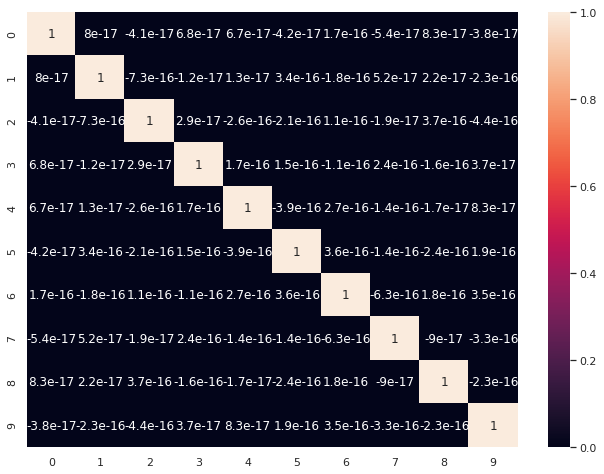

In [21]:
# We want to figure out, whether the PCAs somehow correlate with each other, which ideally should not be the case
correlation_matrix = np.corrcoef(pd.DataFrame(components).transpose())
sns.heatmap(correlation_matrix, annot = True)
# The result looks quite dense due to the amount of variables, 
# however we see a dark color for every correlation, which means that it is ~ 0

## Clustering
As we now reduced the dimensions of the data, we want to find potential clusters within the data set, containing of multiple consumers that have a similar consumer behavior. This is supposed to help us fiding patterns in the data set.

We will use the hierarchical clustering method, as we do not know, how many clusters we will expect. An alternative solution would be k-means clustering, where we would need to provide a number of clusters to be generated. Based on the hierarchical distance illustrated by a dendrogram, we will decide how many clusters we will produce later on.

In [22]:
# Import required packages
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

CPU times: user 18.2 s, sys: 623 ms, total: 18.9 s
Wall time: 18.8 s


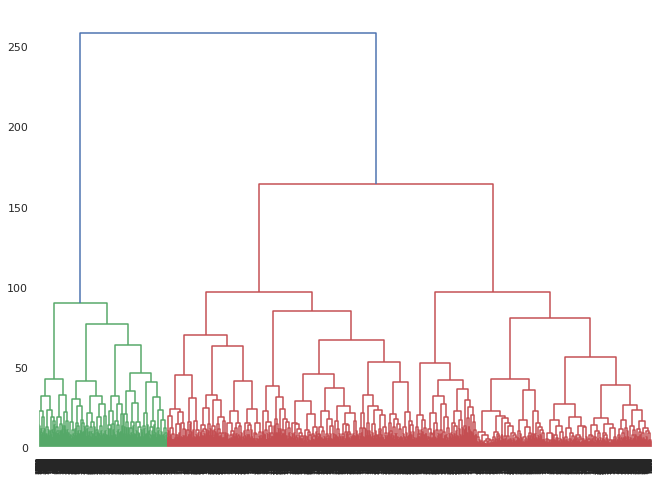

In [23]:
%%time
# Apply linkage function using ward's method and create dendrogram
merged_data = linkage(pd.DataFrame(components), method='ward')
consumer_dend = dendrogram(merged_data)
# We cut the dendrogram at hierarchical distance of ~80 - so we extract 6 clusters

In [24]:
# Transform data set and attach principal components along with a cluster number
cluster_cut = pd.Series(cut_tree(merged_data, n_clusters = 6).reshape(-1,))
df_pca_cluster = pd.concat([pd.DataFrame(components), cluster_cut], axis=1)
df_pca_cluster.columns = [f'PC{index}' for index in range(1, len(components[0])+1)] + ["cluster_nr"]
df_pca_cluster.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,cluster_nr
0,1.201847,-2.829485,-1.126692,-0.089032,-1.193244,-0.392161,-0.007558,-0.229991,0.114619,1.513627,0
1,-1.305771,1.736816,1.097431,0.888410,1.168785,-1.022213,-1.944969,0.507680,-0.803525,2.025489,1
2,-0.466225,-0.900521,0.845509,0.369981,1.074432,-0.782219,0.432169,-0.093928,-0.058202,-1.226330,2
3,4.152954,-1.589634,-0.110163,-0.352990,2.079481,-1.176402,0.261474,-0.761668,-0.100195,-2.961351,0
4,1.712415,-0.346343,-1.420544,0.800172,0.196495,-0.133017,1.209063,0.002586,-0.809204,1.374458,0


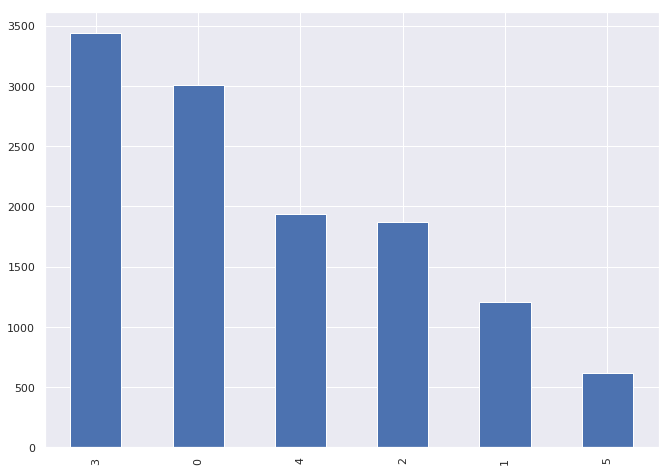

In [25]:
# Cluster count
df_pca_cluster.cluster_nr.value_counts().plot(kind="bar")

In [26]:
# Merge demographic information to principal components and the cluster number
df_pca_cluster.index = df_exp_demographic.index
people_data = df_exp_demographic.join(df_pca_cluster)
people_data = people_data.join(df_exp_clean)
people_data.sample(5)

,age,hhsize,num_child,blsurbn,income,educatio,race,sex,work,empstat,...,gas,gasoline,hlthbeau,homeval2,jewelry,tailors,telephon,tobacco,utility,water
newid,,,,,,,,,,,,,,,,,,,,,
75733,31,3,1,1,71819.187500,41,1,1,0,1,...,847,1321.00,120,0.0,70,42,1510.0,26,3378.476563,260.0
85625,30,1,0,1,40346.234380,43,1,1,0,1,...,427,915.25,348,0.0,0,210,358.0,832,1421.422974,115.0
108862,66,2,0,1,35818.378910,43,1,1,0,1,...,711,1825.00,222,662.5,106,3,944.0,0,2358.726807,374.0
89619,43,4,2,1,14726.975590,40,2,2,0,1,...,0,510.00,111,0.0,0,584,899.0,0,2198.781006,131.0
99939,43,2,1,1,334.283051,43,1,2,0,4,...,648,1380.00,411,587.5,0,3,943.0,403,3247.167969,539.0


### Cluster Analysis
Now, we are going to analyze the clusters created in the step before and detect major differences between the group.
For this purpose, we merge the data with demographic data and take mean/median values for the attributes.

In [27]:
median_cols = ['educatio', 'age', 'race', 'empstat', 'occup', 'emptype', 'marital']
skip = ['emptype', 'empstat', 'occup', 'age_group']

In [28]:
# Next, we assemble a dataset based on the averaged consumer data and connect it with the demographic information
def assemble_cluster_report(people_data):
    '''Create cluster report based on principal components and average values for every variable'''
    cluster_summaries = pd.DataFrame()
    for column in cols_dem + list(people_data):
        if column in skip:
            continue
        elif column in median_cols:
            cluster_summaries[column] = people_data.groupby(["cluster_nr"])[column].median()
        else:
            cluster_summaries[column] = people_data.groupby(["cluster_nr"])[column].mean()
    return cluster_summaries

In [29]:
# Run function
cluster_summaries = assemble_cluster_report(people_data)
cluster_summaries

,age,hhsize,num_child,blsurbn,income,educatio,race,sex,work,marital,...,gas,gasoline,hlthbeau,homeval2,jewelry,tailors,telephon,tobacco,utility,water
0,48.0,3.061605,1.062271,1.114885,56593.509405,40,1,1.349983,0.881119,1,...,380.324009,1510.931918,332.483183,830.550856,137.241092,89.356310,968.474692,144.056277,3128.697678,432.071628
1,43.5,2.604825,0.889351,1.071547,46052.584403,40,1,1.450915,0.503328,2,...,166.158070,1057.990266,335.967554,252.294759,70.845258,263.320300,953.860940,224.677205,2014.473134,100.546090
2,47.0,2.937366,0.940578,1.139186,47151.838497,39,1,1.347966,0.835118,1,...,361.074411,1430.305915,220.451820,689.516167,52.847966,55.813704,872.794352,928.094218,2887.784212,383.646012
3,52.0,2.054990,0.514111,1.148094,28565.219437,39,1,1.491999,1.414315,2,...,243.100960,750.749404,179.611871,432.741184,24.566482,56.999709,575.823800,169.113471,1904.495331,224.716308
4,47.0,3.580579,1.430269,1.061467,94865.664240,43,1,1.316116,0.483471,1,...,449.379132,1904.807774,505.132231,1120.751561,85.598140,219.162707,1216.224948,253.137397,3706.715817,532.326937
5,46.0,3.226537,1.124595,1.045307,110559.955569,43,1,1.331715,0.462783,1,...,467.833333,1844.643285,571.813916,1154.760180,598.407767,302.571197,1336.620227,228.341424,3943.638279,523.767395


In [30]:
# We now define the columns we would like to plot in the next step for the spider plot
plot_clusters = [
     'alcohol',
     'books',
     'clothes',
     'elect',
     'food',
     'foodhome',
     'foodout',
     'gas',
     'gasoline',
     'hlthbeau',
     'homeval2',
     'jewelry',
     'telephon',
     'tobacco',
     'utility',
     'water'
]

In [31]:
# After assembling the cluster data set, we see how the typical average expenses are like for every cluster and variable
def get_cluster_barplots(people_data, plot_clusters):
    '''Create barplots for average variable values per cluster'''
    fig, axs = plt.subplots(len(list(plot_clusters)) // 3 + 1, 3, figsize = (30, 30))
    rindex = 0
    for index, column in enumerate(list(plot_clusters)):
        cindex = index % 3
        if index > 0 and cindex == 0:
            rindex += 1
        vars()[f'plt{index}'] = sns.barplot(x='cluster_nr', y=column, data=people_data, ax = axs[rindex, cindex])
    return plt

<module 'matplotlib.pyplot' from '/anaconda/envs/azureml_py36_automl/lib/python3.6/site-packages/matplotlib/pyplot.py'>

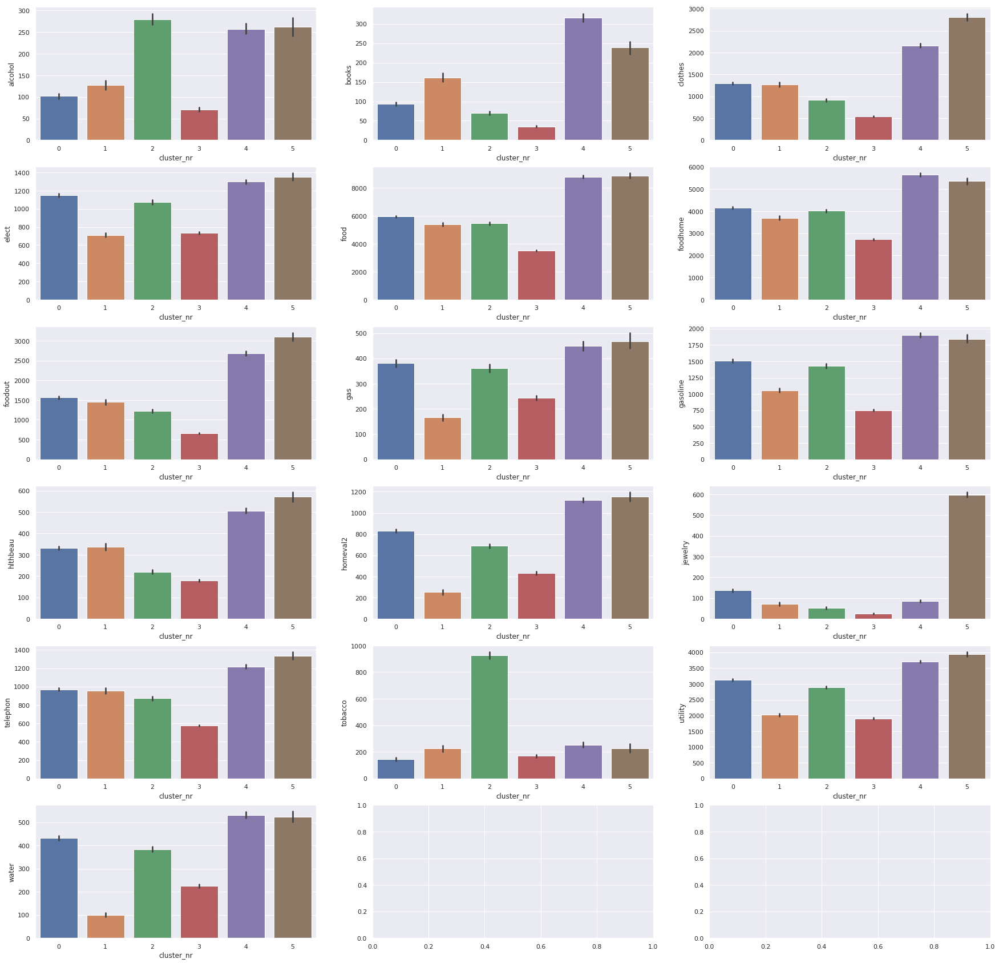

In [32]:
# Run function
get_cluster_barplots(people_data, plot_clusters)

In [33]:
cluster_summaries[plot_clusters]

,alcohol,books,clothes,elect,food,foodhome,foodout,gas,gasoline,hlthbeau,homeval2,jewelry,telephon,tobacco,utility,water
0,101.779687,93.642025,1294.719580,1149.018948,5951.987351,4147.089560,1564.856111,380.324009,1510.931918,332.483183,830.550856,137.241092,968.474692,144.056277,3128.697678,432.071628
1,126.995341,161.599002,1275.404700,712.486606,5403.566426,3690.768386,1448.086398,166.158070,1057.990266,335.967554,252.294759,70.845258,953.860940,224.677205,2014.473134,100.546090
2,279.198822,69.790150,914.507762,1074.306237,5472.330883,4014.069513,1230.479256,361.074411,1430.305915,220.451820,689.516167,52.847966,872.794352,928.094218,2887.784212,383.646012
3,70.914315,35.265348,540.875633,733.855761,3533.279899,2724.551717,659.491722,243.100960,750.749404,179.611871,432.741184,24.566482,575.823800,169.113471,1904.495331,224.716308
4,257.133471,315.547521,2163.007541,1298.433084,8795.595709,5647.850155,2684.436183,449.379132,1904.807774,505.132231,1120.751561,85.598140,1216.224948,253.137397,3706.715817,532.326937
5,262.119256,239.236246,2808.620388,1351.834709,8886.163921,5351.411408,3104.416990,467.833333,1844.643285,571.813916,1154.760180,598.407767,1336.620227,228.341424,3943.638279,523.767395


In [34]:
# Scale values to have a common scale (e.g. food is way higher than other values in comparison)
scaled = (cluster_summaries[plot_clusters] - cluster_summaries[plot_clusters].min())/(cluster_summaries[plot_clusters].max()-cluster_summaries[plot_clusters].min())

In [35]:
# Next, we create a scatter polar plot, or also called "spiderplot" to illustrate 
# the dimensions of each variable given a cluster. This helps us to better compare the consumer behavior in one place.
import plotly.graph_objects as go
def get_spiderplot(scaled, plot_clusters):
    '''Create spiderplot to illustrate expense dimensions'''
    fig = go.Figure()
    for index, row in scaled.iterrows():
        fig.add_trace(go.Scatterpolar(
              r=row.to_list(),
              theta=plot_clusters,
              fill='toself',
              name=index
        ))
    return fig

In [36]:
# Run function
get_spiderplot(scaled, plot_clusters)

## Results
For n_pca=10 and n_clusters=6

Cluster0:
- Average income
- College, no degree
- Three people, married, 1 child

Cluster1:
- Average income
- College, no degree
- Two people, widowed, no children

Cluster2:
- Average income
- High school degree
- Three people, no children, married

Cluster3:
- Low income
- High school degree
- Two people, widowed, 1 child
- Strong expenses for alcohol and tobacco

Cluster4:
- High income
- Bachelor degree
- Four people, more than 1 child
- High expenses for books and home utilities, cook at home
- Low expenses for clothes, jewellry, tobacco

Cluster 5:
- Very high income
- Bachelor degree
- Three people, 1 child
- High expense on jewellry
- Low on tobacco